# Exploratory Data Analysis On Dry Beans

## Table of Contents
1. [Problem Statement](#section1)<br>
2. [Importing Packages](#section2)<br>
3. [Dataset (source, loading and description)](#section3)<br>
4. [Data Visualization](#section4)<br>
5. [Data Spliting](#section5)<br>
6. [Train test split](#section6)<br>
7. [Data Standardization](#section7)<br>
8. [Importing EvaluAtion Libraries](#section8)
9. [Implementing KNN ,Decision Tree,Naive Bayes,Ramdom Forest,Logistic Regression,SVM,](#section9)
10. [Comparing Model](#section10)<br>
11. [Conclusion](#section11)<br>

# 1. Problem Statements

 - Objective-To determine seven different types of beans like HOROZ,CALI,DERMASON,SIRA,SEKER,BOMBAY,BARBUNYA based on their physical appearance like Area,Perimeter etc


# 2. Importing Packages 

In [3]:
import numpy as np                     

import pandas as pd
pd.set_option('mode.chained_assignment', None)      # To suppress pandas warnings.
pd.set_option('display.max_colwidth', -1)           # To display all the data in each column
pd.options.display.max_columns = 50                 # To display every column of the dataset in head()

import warnings
warnings.filterwarnings('ignore')

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_48952\3252113585.py:5: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)           # To display all the data in each column


In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)      # To apply seaborn styles to the plots.

In [5]:
!pip install plotly --upgrade

In [6]:
!pip install chart-studio

In [7]:
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly import tools
init_notebook_mode(connected=True)

# 3. Import the dataset

In [8]:
df_bean = pd.read_csv("C:/nishant/eda Assigments/DryBeans/archive/Dry_Bean.csv")
df_bean.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


###  Check the info of the dataset 

In [9]:
df_bean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

### Check the shape of dataset

In [10]:
df_bean.shape

(13611, 17)

### Check the Null Values

In [11]:
df_bean.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

###  Check the columns present in the dataset

In [12]:
df_bean.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

### Check the descriptive statistics of the dataset

In [171]:
df_bean.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
count,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000
mean,53048.460385,854.993406,319.895602,202.365321,1.581075,0.750315,53767.986709,253.034094,0.749829,0.987152,0.873671,0.800352,0.006561,0.001719,0.644341,0.995078,2.106771
std,29392.438324,214.722684,85.809260,45.051632,0.245245,0.091858,29844.248525,59.307709,0.048939,0.004650,0.059393,0.061464,0.001130,0.000595,0.098653,0.004347,1.828886
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687,0.000000
25%,36282.500000,703.230000,253.086806,175.886357,1.430662,0.715144,36673.000000,214.933277,0.718735,0.985678,0.833410,0.763228,0.005893,0.001158,0.582517,0.993720,0.000000
50%,44580.000000,793.896000,296.404589,192.491117,1.549860,0.763997,45122.000000,238.245711,0.759903,0.988288,0.883490,0.801514,0.006643,0.001700,0.642424,0.996393,2.000000
75%,61382.000000,977.146500,376.312489,217.245403,1.703916,0.809671,62360.000000,279.560351,0.786849,0.990019,0.917031,0.834470,0.007270,0.002173,0.696341,0.997891,4.000000
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733,6.000000


# 4.Data Visualization

### Droping Duplicate Columns


In [13]:
df_bean.drop_duplicates(inplace=True)

### Checking Balanced Data

In [14]:
df_bean.Class.value_counts()


DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1860
CALI        1630
BARBUNYA    1322
BOMBAY      522 
Name: Class, dtype: int64

###  Visualizing Bargraph of Class
 

<AxesSubplot:xlabel='Class', ylabel='count'>

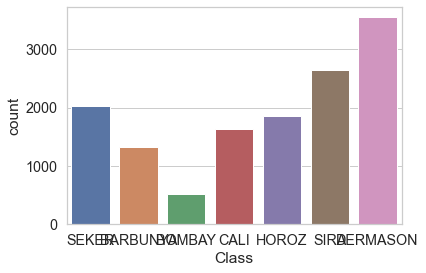

In [15]:
sns.countplot(df_bean.Class)

### Visualizing Piegraph of Class


<AxesSubplot:title={'center':'Popular Class'}, ylabel='Class'>

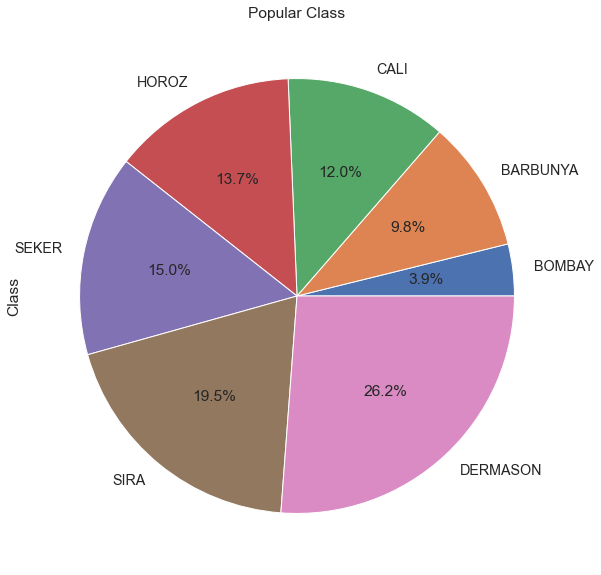

In [16]:
df_bean['Class'].value_counts().sort_values().plot(kind='pie',figsize=(10,10), autopct='%1.1f%%',title="Popular Class")


Inference-from eda we performed above we observed that
- we do not have null values
- we have 7 different/unique values in class
- we have inbalanced data
- we have 13611 rows and 17 column

### Change Categorical To Numeric Values

In [17]:
class_ = {'DERMASON':0, 'SIRA':1, 'SEKER':2, 'HOROZ':3, 'CALI':4, 'BARBUNYA':5, 'BOMBAY':6}
df_bean['Class'] = df_bean['Class'].replace(class_)
df_bean.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,2
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,2
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,2
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,2
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,2


- Dataset is now balanced and changed from categorical to numeric values for further process


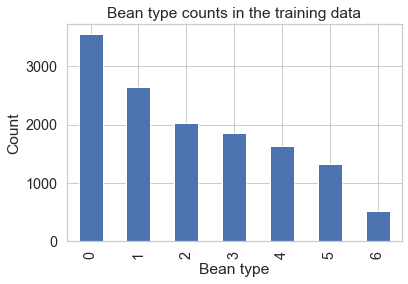

In [18]:
df_bean["Class"].value_counts().plot(kind='bar',
                                   title= "Bean type counts ",
                                   xlabel= 'Bean type',
                                   ylabel= 'Count');


### Quality Check

- Quality check is performed in a visualized manner on every attribute to check if the data is symetric skewed etc or not


Text(0.5, 1.0, 'Area')

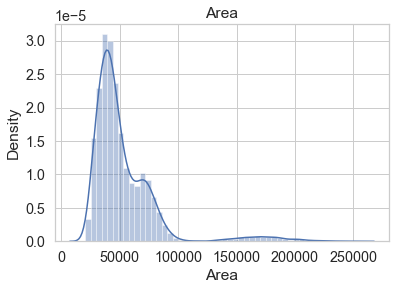

In [19]:
sns.distplot(df_bean.Area)
plt.title('Area')

Text(0.5, 1.0, 'Perimeter')

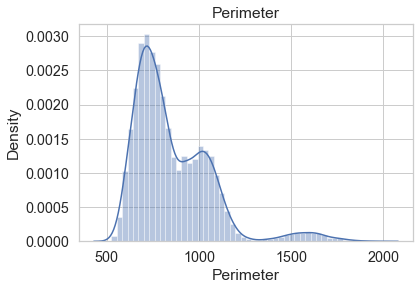

In [20]:
sns.distplot(df_bean.Perimeter)
plt.title('Perimeter')

Text(0.5, 1.0, 'MajorAxisLength')

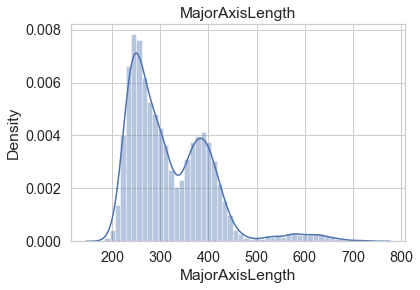

In [21]:
sns.distplot(df_bean.MajorAxisLength)
plt.title('MajorAxisLength')

Text(0.5, 1.0, 'MinorAxisLength')

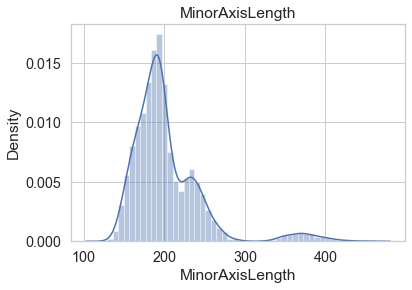

In [22]:
sns.distplot(df_bean.MinorAxisLength)
plt.title('MinorAxisLength')

Text(0.5, 1.0, 'Eccentricity')

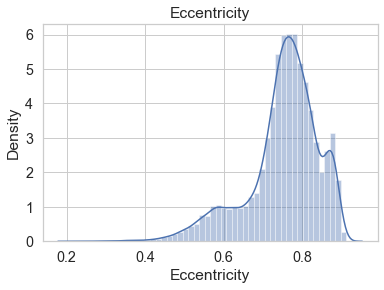

In [23]:
sns.distplot(df_bean.Eccentricity)
plt.title('Eccentricity')

Text(0.5, 1.0, 'ConvexArea ')

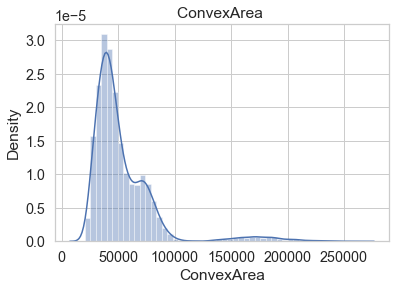

In [24]:
sns.distplot(df_bean.ConvexArea )
plt.title('ConvexArea ')

Text(0.5, 1.0, 'EquivDiameter ')

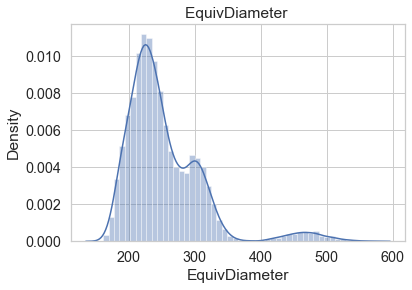

In [25]:
sns.distplot(df_bean.EquivDiameter )
plt.title('EquivDiameter ')

Text(0.5, 1.0, 'Extent')

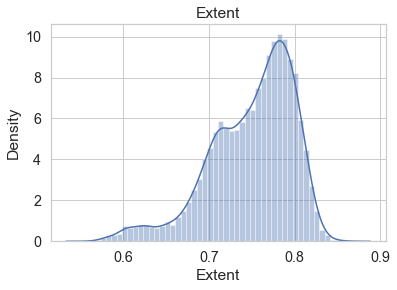

In [26]:
sns.distplot(df_bean.Extent)
plt.title('Extent')

Text(0.5, 1.0, 'roundness')

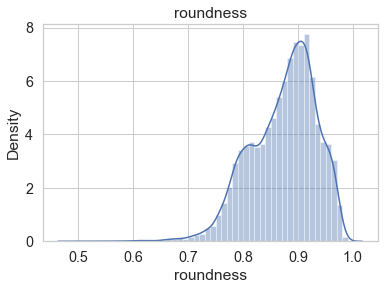

In [27]:
sns.distplot(df_bean.roundness)
plt.title('roundness')

Text(0.5, 1.0, 'Compactness')

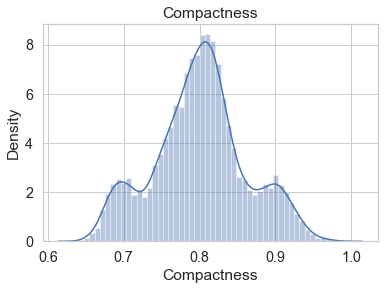

In [28]:
sns.distplot(df_bean.Compactness)
plt.title('Compactness')

Text(0.5, 1.0, 'Solidity')

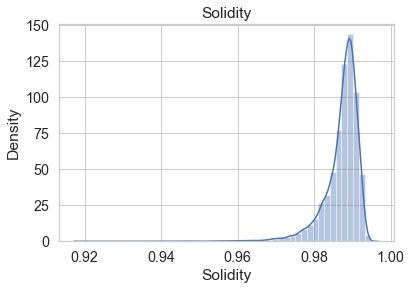

In [29]:
sns.distplot(df_bean.Solidity)
plt.title('Solidity')

Text(0.5, 1.0, 'ShapeFactor1')

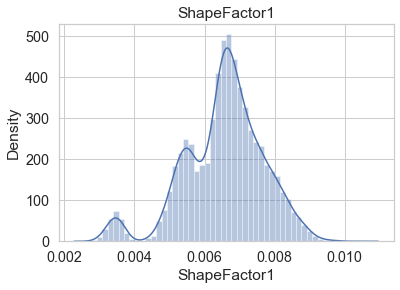

In [30]:
sns.distplot(df_bean.ShapeFactor1)
plt.title('ShapeFactor1')

Text(0.5, 1.0, 'ShapeFactor2')

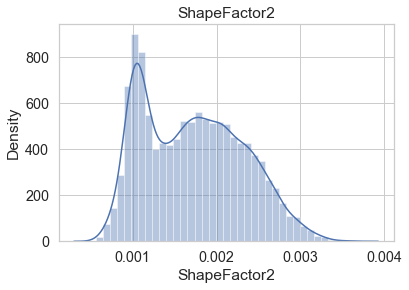

In [31]:
sns.distplot(df_bean.ShapeFactor2)
plt.title('ShapeFactor2')

Text(0.5, 1.0, 'ShapeFactor3')

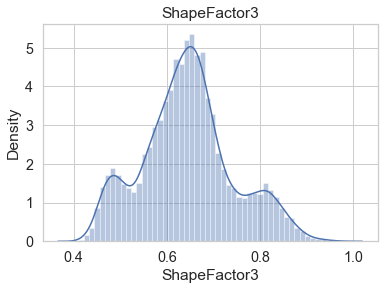

In [32]:
sns.distplot(df_bean.ShapeFactor3)
plt.title('ShapeFactor3')

Text(0.5, 1.0, 'ShapeFactor4')

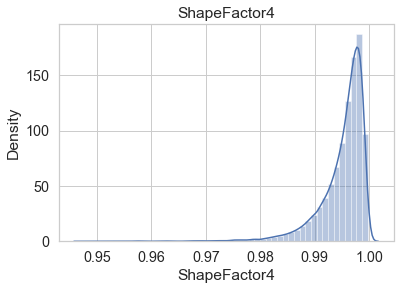

In [33]:
sns.distplot(df_bean.ShapeFactor4)
plt.title('ShapeFactor4')

### Correlation Check

In [34]:
df_bean.corr()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
Area,1.000000,0.966908,0.932623,0.952041,0.243698,0.268580,0.999940,0.984998,0.054648,-0.197333,-0.359068,-0.269797,-0.848390,-0.641208,-0.273754,-0.358019,0.773074
Perimeter,0.966908,1.000000,0.977561,0.914336,0.386097,0.391062,0.967871,0.991453,-0.020620,-0.304662,-0.548336,-0.407426,-0.865756,-0.768590,-0.408888,-0.431215,0.858515
MajorAxisLength,0.932623,0.977561,1.000000,0.828360,0.550075,0.541011,0.933392,0.962271,-0.077287,-0.284857,-0.595710,-0.567902,-0.775840,-0.859401,-0.567607,-0.484464,0.815896
MinorAxisLength,0.952041,0.914336,0.828360,1.000000,-0.005354,0.022391,0.951780,0.949214,0.145906,-0.156819,-0.214090,-0.018618,-0.947194,-0.475326,-0.022744,-0.266402,0.786426
AspectRation,0.243698,0.386097,0.550075,-0.005354,1.000000,0.924185,0.245267,0.305237,-0.371234,-0.269110,-0.764975,-0.987644,0.020875,-0.837338,-0.978528,-0.451598,0.306457
Eccentricity,0.268580,0.391062,0.541011,0.022391,0.924185,1.000000,0.270350,0.319360,-0.319678,-0.298282,-0.720138,-0.970308,0.017266,-0.859246,-0.981058,-0.450611,0.237328
ConvexArea,0.999940,0.967871,0.933392,0.951780,0.245267,0.270350,1.000000,0.985255,0.052864,-0.206901,-0.363620,-0.271651,-0.848382,-0.642773,-0.275631,-0.364302,0.774576
EquivDiameter,0.984998,0.991453,0.962271,0.949214,0.305237,0.319360,0.985255,1.000000,0.028762,-0.232344,-0.437189,-0.328980,-0.893403,-0.714693,-0.331594,-0.394693,0.835996
Extent,0.054648,-0.020620,-0.077287,0.145906,-0.371234,-0.319678,0.052864,0.028762,1.000000,0.192268,0.344510,0.354912,-0.141525,0.237584,0.348226,0.148622,-0.016685
Solidity,-0.197333,-0.304662,-0.284857,-0.156819,-0.269110,-0.298282,-0.206901,-0.232344,0.192268,1.000000,0.609668,0.304802,0.154346,0.344337,0.308614,0.700150,-0.326391


### Heatmap to Check Corelation with the Help of Numeric Values
 

<AxesSubplot:>

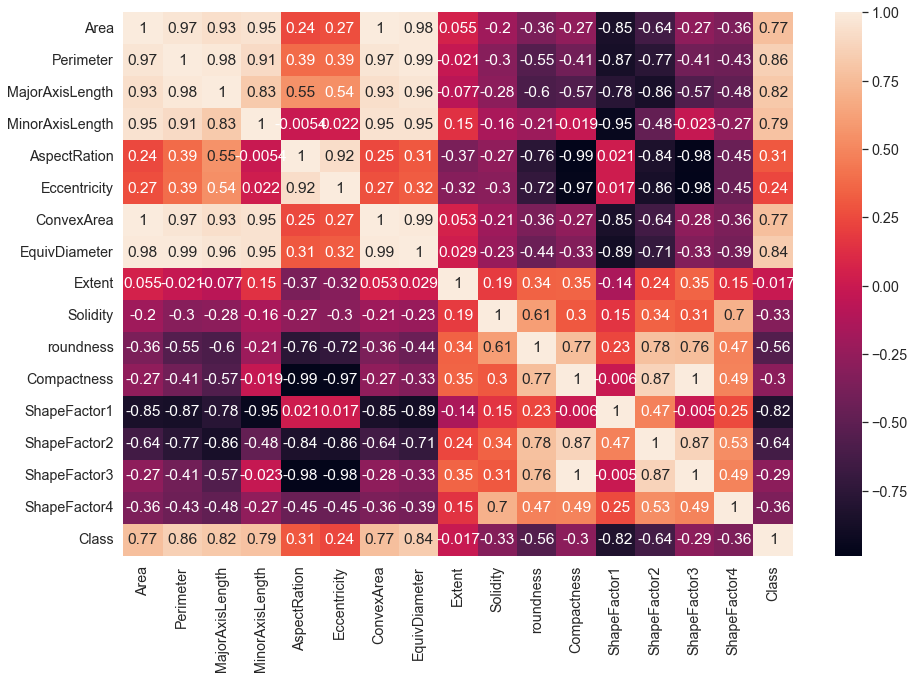

In [35]:
plt.figure(figsize=(15,10))
sns.heatmap(df_bean.corr(),annot=True)

### Droping Few Attributes



In [36]:
df_bean.drop(['ConvexArea','Extent','Solidity','roundness','ShapeFactor4','AspectRation'],axis=1)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,Eccentricity,EquivDiameter,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,Class
0,28395,610.291,208.178117,173.888747,0.549812,190.141097,0.913358,0.007332,0.003147,0.834222,2
1,28734,638.018,200.524796,182.734419,0.411785,191.272751,0.953861,0.006979,0.003564,0.909851,2
2,29380,624.110,212.826130,175.931143,0.562727,193.410904,0.908774,0.007244,0.003048,0.825871,2
3,30008,645.884,210.557999,182.516516,0.498616,195.467062,0.928329,0.007017,0.003215,0.861794,2
4,30140,620.134,201.847882,190.279279,0.333680,195.896503,0.970516,0.006697,0.003665,0.941900,2
...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,0.765002,231.515799,0.801865,0.006858,0.001749,0.642988,0
13607,42101,757.499,281.576392,190.713136,0.735702,231.526798,0.822252,0.006688,0.001886,0.676099,0
13608,42139,759.321,281.539928,191.187979,0.734065,231.631261,0.822730,0.006681,0.001888,0.676884,0
13609,42147,763.779,283.382636,190.275731,0.741055,231.653247,0.817457,0.006724,0.001852,0.668237,0


<AxesSubplot:>

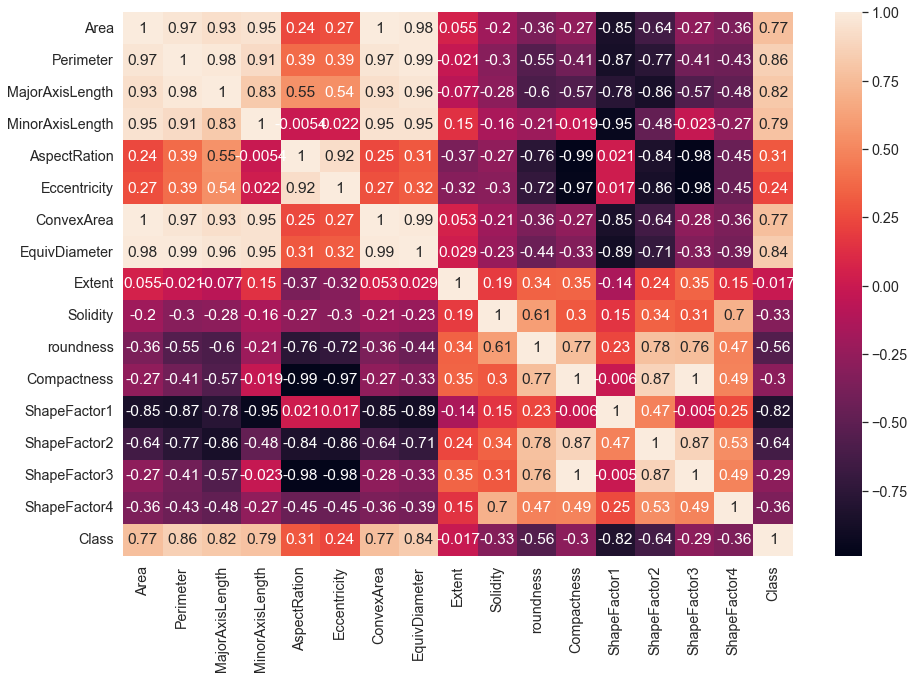

In [37]:
plt.figure(figsize=(15,10))
sns.heatmap(df_bean.corr(),annot=True)

- All the features have high correlation with the class.
- Features like 'Area','ConvexArea' and 'EquivDiameter' have very high multi colinearity, so from these 3 features 2 have to be eliminated.
- Other features also have multi colinearity among them. Eliminating them requires domain Knowledge
- Out of 11 features we are left with 6 features to classify our model.
- All these 6 features have high colinearity with the class attribute.

### Pairplot of Whole Dataset 


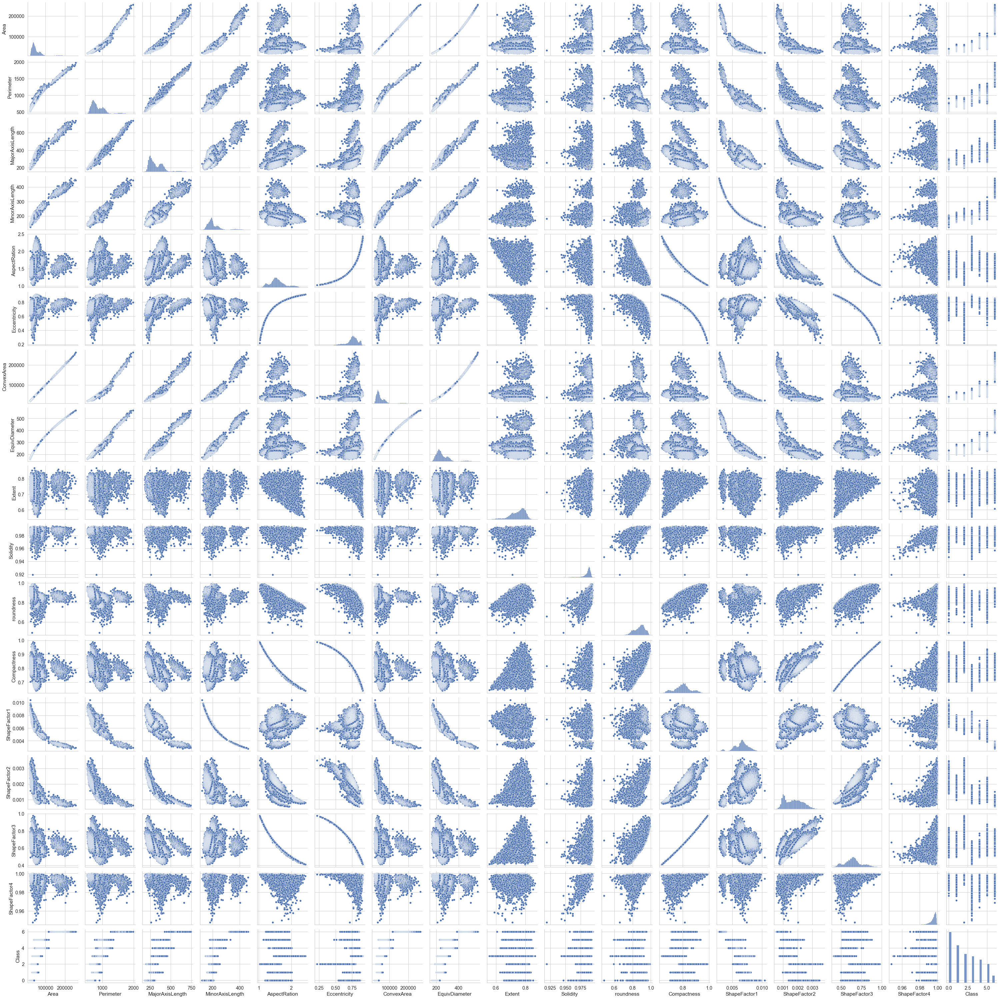

In [38]:
sns.pairplot(df_bean)

### Pairplot of Dataset With Respect To Class 

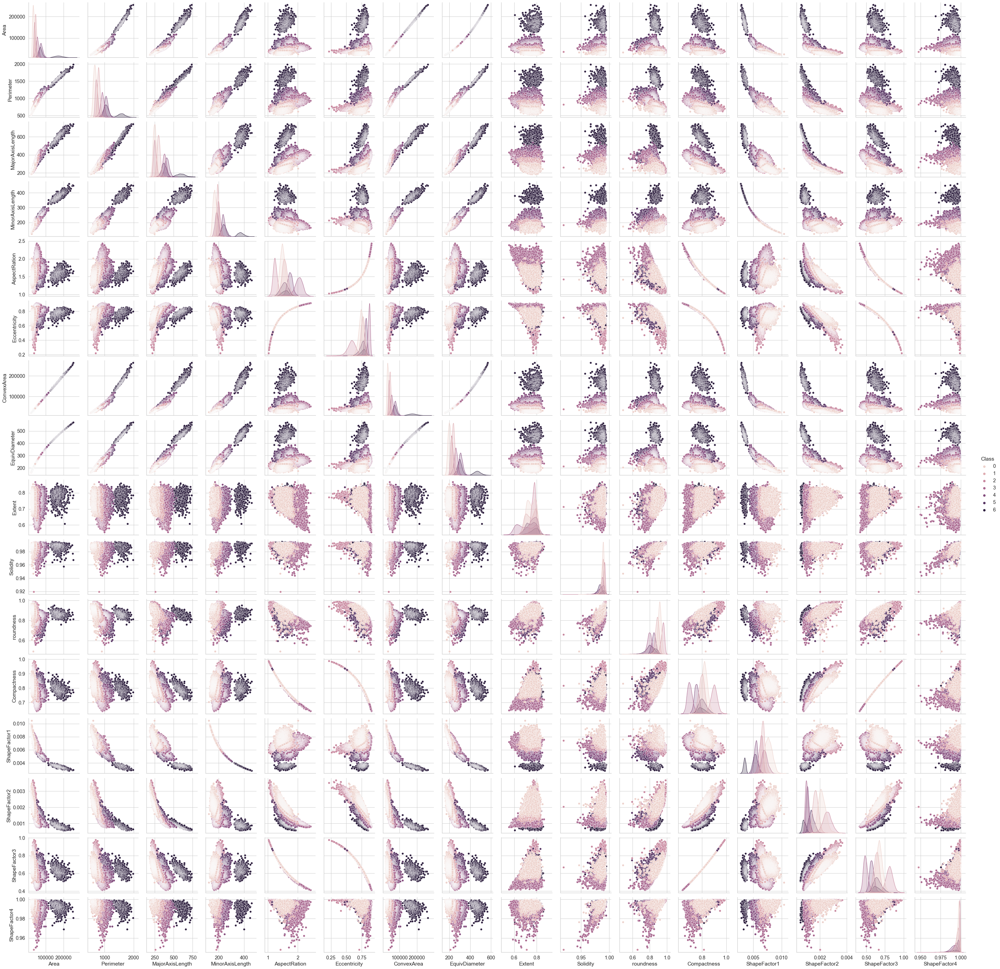

In [39]:
sns.pairplot(df_bean, hue='Class')


### Inference-From above visualization we have observed

- Pairplot before droping attributes were not so helpful in checking corelation
- Heatmap was great to check corelation and helpful in removing unwanted attributes
- Pairplot after droping attribute was much clearly visualized

### OUTLIER


Removing the outlier from independent variables with respect to target variables and then visualizing it with the help of boxplot


<AxesSubplot:xlabel='Class', ylabel='Area'>

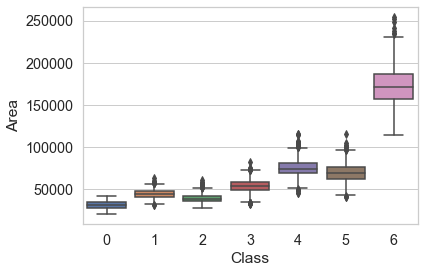

In [40]:
sns.boxplot(x=df_bean.Class,y=df_bean.Area)


<AxesSubplot:xlabel='Class', ylabel='Perimeter'>

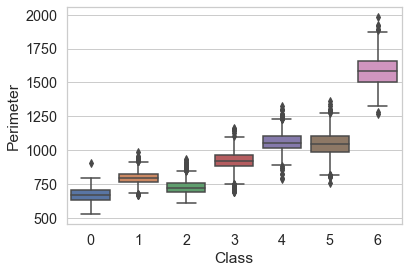

In [41]:
sns.boxplot(x=df_bean.Class,y=df_bean.Perimeter)


<AxesSubplot:xlabel='Class', ylabel='EquivDiameter'>

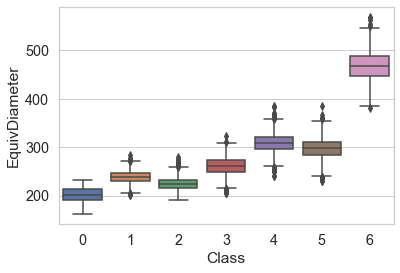

In [42]:
sns.boxplot(x=df_bean.Class,y=df_bean.EquivDiameter)


<AxesSubplot:xlabel='Class', ylabel='ShapeFactor1'>

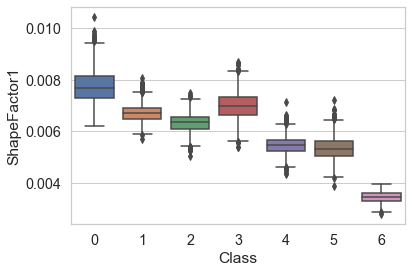

In [43]:
sns.boxplot(x=df_bean.Class,y=df_bean.ShapeFactor1)


<AxesSubplot:xlabel='Class', ylabel='ShapeFactor2'>

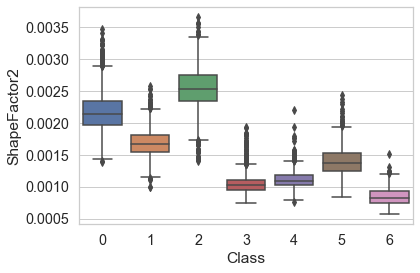

In [44]:
sns.boxplot(x=df_bean.Class,y=df_bean.ShapeFactor2)


<AxesSubplot:xlabel='Class', ylabel='ShapeFactor3'>

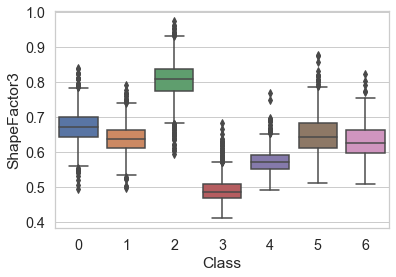

In [45]:
sns.boxplot(x=df_bean.Class,y=df_bean.ShapeFactor3)


<AxesSubplot:xlabel='Class', ylabel='MajorAxisLength'>

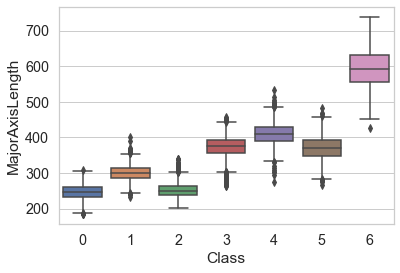

In [46]:
sns.boxplot(x=df_bean.Class,y=df_bean.MajorAxisLength)


<AxesSubplot:xlabel='Class', ylabel='MinorAxisLength'>

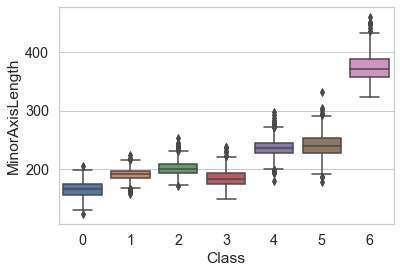

In [47]:
sns.boxplot(x=df_bean.Class,y=df_bean.MinorAxisLength)


<AxesSubplot:xlabel='Class', ylabel='Compactness'>

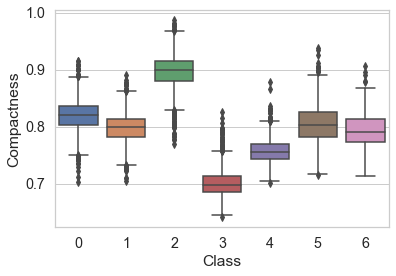

In [48]:
sns.boxplot(x=df_bean.Class,y=df_bean.Compactness)


<AxesSubplot:xlabel='Class', ylabel='Eccentricity'>

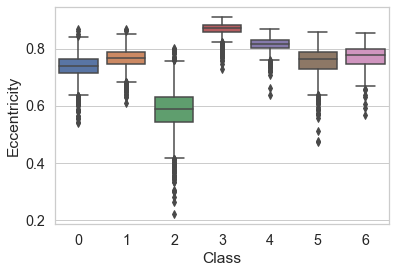

In [49]:
sns.boxplot(x=df_bean.Class,y=df_bean.Eccentricity)


### Remove Outliers

In [50]:
q1 = df_bean['Area'].quantile(0.25)
q3 = df_bean['Area'].quantile(0.75)
iqr = q3-q1

In [51]:
q1,q3,iqr

(36282.5, 61382.0, 25099.5)

In [52]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(-1366.75, 99031.25)

In [53]:
# find the outliers
df_bean.loc[(df_bean['Area'] > upper_limit) | (df_bean['Area'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
3344,100846,1297.770,469.285655,274.423910,1.710076,0.811200,102015,358.331013,0.792036,0.988541,0.752442,0.763567,0.004653,0.000976,0.583034,0.997033,5
3345,102015,1271.970,456.791895,286.894421,1.592195,0.778162,103901,360.401904,0.804973,0.981848,0.792356,0.788985,0.004478,0.001070,0.622497,0.991137,5
3346,102379,1296.377,456.722068,286.557574,1.593823,0.778679,104111,361.044307,0.739412,0.983364,0.765523,0.790512,0.004461,0.001075,0.624909,0.995995,5
3347,105542,1265.623,466.135980,288.999342,1.612931,0.784610,107112,366.579116,0.747888,0.985342,0.827993,0.786421,0.004417,0.001042,0.618458,0.997530,5
3348,115967,1359.763,449.454969,331.305270,1.356619,0.675755,118497,384.257427,0.742712,0.978649,0.788166,0.854941,0.003876,0.001277,0.730924,0.991585,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5496,106806,1263.899,494.727002,276.176469,1.791344,0.829679,108109,368.767709,0.705451,0.987947,0.840196,0.745396,0.004632,0.000882,0.555616,0.995299,4
5497,107911,1298.822,498.597779,279.350337,1.784848,0.828309,110337,370.670410,0.731898,0.978013,0.803852,0.743426,0.004620,0.000871,0.552682,0.986453,4
5498,114858,1300.819,512.736642,287.561719,1.783049,0.827926,115826,382.415674,0.688713,0.991643,0.852977,0.745833,0.004464,0.000852,0.556266,0.991850,4
5499,115608,1298.623,500.298310,296.898826,1.685080,0.804876,117222,383.662192,0.779650,0.986231,0.861453,0.766867,0.004328,0.000923,0.588085,0.990970,4


In [54]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['Area'] <= upper_limit) & (df_bean['Area'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 12992
outliers: 551


<AxesSubplot:xlabel='Area'>

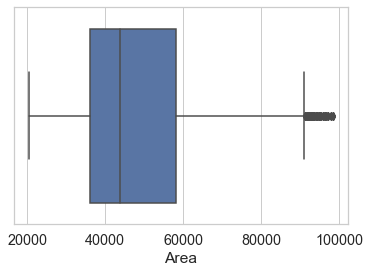

In [55]:
sns.boxplot(new_df['Area'])


In [56]:
q1 = df_bean['Perimeter'].quantile(0.25)
q3 = df_bean['Perimeter'].quantile(0.75)
iqr = q3-q1

In [57]:
q1,q3,iqr

(703.23, 977.1465000000001, 273.91650000000004)

In [58]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(292.35524999999996, 1388.0212500000002)

In [59]:
# find the outliers
df_bean.loc[(df_bean['Perimeter'] > upper_limit) | (df_bean['Perimeter'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
3364,134251,1391.532,523.629021,327.675520,1.598011,0.780001,135409,413.441268,0.789684,0.991448,0.871246,0.789569,0.003900,0.000935,0.623419,0.996231,6
3368,137075,1432.713,526.898062,334.117512,1.576984,0.773233,139517,417.767053,0.676997,0.982497,0.839170,0.792880,0.003844,0.000937,0.628659,0.991385,6
3369,137115,1427.056,519.199745,337.474646,1.538485,0.759943,138970,417.828003,0.789974,0.986652,0.846083,0.804754,0.003787,0.000980,0.647629,0.996367,6
3371,137518,1417.944,519.780000,339.930272,1.529078,0.756504,139153,418.441580,0.778239,0.988250,0.859511,0.805036,0.003780,0.000979,0.648083,0.990969,6
3372,137748,1389.634,499.370544,353.301314,1.413441,0.706720,138869,418.791357,0.809463,0.991928,0.896384,0.838638,0.003625,0.001106,0.703315,0.994094,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3866,237270,1921.685,738.144502,412.921647,1.787614,0.828895,240671,549.637650,0.784115,0.985869,0.807399,0.744621,0.003111,0.000590,0.554460,0.991160,6
3867,241322,1895.940,726.373493,427.370120,1.699636,0.808598,244319,554.311026,0.820823,0.987733,0.843641,0.763121,0.003010,0.000630,0.582354,0.989790,6
3868,248424,1884.557,715.053040,446.043618,1.603101,0.781591,251082,562.408446,0.807536,0.989414,0.878992,0.786527,0.002878,0.000679,0.618625,0.991718,6
3869,251432,1919.868,719.125690,450.926187,1.594775,0.778981,257425,565.803115,0.766776,0.976719,0.857211,0.786793,0.002860,0.000676,0.619043,0.987235,6


In [60]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['Perimeter'] <= upper_limit) & (df_bean['Perimeter'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 13043
outliers: 500


<AxesSubplot:xlabel='Perimeter'>

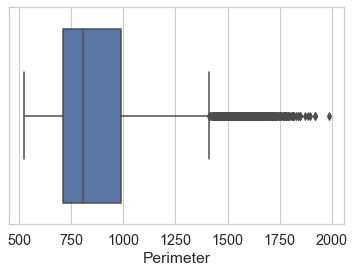

In [167]:
sns.boxplot(new_df['Perimeter'])


In [62]:
q1 = df_bean['EquivDiameter'].quantile(0.25)
q3 = df_bean['EquivDiameter'].quantile(0.75)
iqr = q3-q1

In [63]:
q1,q3,iqr

(214.9332771, 279.56035055, 64.62707345000001)

In [64]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(117.99266692499998, 376.500960725)

In [65]:
# find the outliers
df_bean.loc[(df_bean['EquivDiameter'] > upper_limit) | (df_bean['EquivDiameter'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
3348,115967,1359.763,449.454969,331.305270,1.356619,0.675755,118497,384.257427,0.742712,0.978649,0.788166,0.854941,0.003876,0.001277,0.730924,0.991585,5
3349,114004,1279.356,451.361256,323.747996,1.394175,0.696795,115298,380.991340,0.748987,0.988777,0.875280,0.844094,0.003959,0.001240,0.712495,0.993342,6
3350,117034,1265.926,425.923788,351.215109,1.212715,0.565722,118019,386.021135,0.746319,0.991654,0.917710,0.906315,0.003639,0.001515,0.821407,0.996132,6
3351,126503,1326.959,475.772459,339.381887,1.401879,0.700830,128220,401.333555,0.771313,0.986609,0.902809,0.843541,0.003761,0.001175,0.711561,0.997523,6
3352,128118,1360.135,504.024964,325.678447,1.547615,0.763206,129274,403.887242,0.782247,0.991058,0.870274,0.801324,0.003934,0.001001,0.642120,0.993755,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3869,251432,1919.868,719.125690,450.926187,1.594775,0.778981,257425,565.803115,0.766776,0.976719,0.857211,0.786793,0.002860,0.000676,0.619043,0.987235,6
3870,254616,1985.370,738.860154,447.418329,1.651386,0.795806,263261,569.374358,0.783747,0.967162,0.811732,0.770612,0.002902,0.000631,0.593843,0.980663,6
5498,114858,1300.819,512.736642,287.561719,1.783049,0.827926,115826,382.415674,0.688713,0.991643,0.852977,0.745833,0.004464,0.000852,0.556266,0.991850,4
5499,115608,1298.623,500.298310,296.898826,1.685080,0.804876,117222,383.662192,0.779650,0.986231,0.861453,0.766867,0.004328,0.000923,0.588085,0.990970,4


In [66]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['EquivDiameter'] <= upper_limit) & (df_bean['EquivDiameter'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 13017
outliers: 526


<AxesSubplot:xlabel='EquivDiameter'>

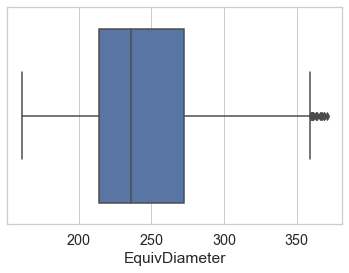

In [67]:
sns.boxplot(new_df['EquivDiameter'])


In [68]:
q1 = df_bean['ShapeFactor1'].quantile(0.25)
q3 = df_bean['ShapeFactor1'].quantile(0.75)
iqr = q3-q1

In [69]:
q1,q3,iqr

(0.005893089, 0.0072703455, 0.0013772565)

In [70]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(0.0038272042499999997, 0.00933623025)

In [71]:
# find the outliers
df_bean.loc[(df_bean['ShapeFactor1'] > upper_limit) | (df_bean['ShapeFactor1'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
3350,117034,1265.926,425.923788,351.215109,1.212715,0.565722,118019,386.021135,0.746319,0.991654,0.917710,0.906315,0.003639,0.001515,0.821407,0.996132,6
3351,126503,1326.959,475.772459,339.381887,1.401879,0.700830,128220,401.333555,0.771313,0.986609,0.902809,0.843541,0.003761,0.001175,0.711561,0.997523,6
3353,129409,1348.888,484.364424,341.172659,1.419705,0.709831,130688,405.917056,0.799334,0.990213,0.893763,0.838041,0.003743,0.001139,0.702312,0.997076,6
3354,129807,1356.314,493.241864,336.464837,1.465954,0.731212,131148,406.540780,0.806315,0.989775,0.886722,0.824222,0.003800,0.001082,0.679342,0.995884,6
3355,130070,1362.228,486.706230,343.114783,1.418494,0.709234,131860,406.952414,0.751537,0.986425,0.880820,0.836136,0.003742,0.001128,0.699123,0.991701,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10218,24446,613.093,234.982560,132.640219,1.771579,0.825455,24874,176.424528,0.692914,0.982793,0.817269,0.750798,0.009612,0.001884,0.563698,0.998636,0
10223,24482,593.198,230.138582,135.776033,1.694987,0.807421,24743,176.554384,0.689828,0.989452,0.874294,0.767166,0.009400,0.002009,0.588543,0.997572,0
10239,24687,597.668,236.372980,133.396772,1.771954,0.825537,24926,177.292032,0.802673,0.990412,0.868477,0.750052,0.009575,0.001869,0.562578,0.996863,0
10259,24880,628.352,240.380282,132.307969,1.816824,0.834894,25346,177.983707,0.692727,0.981614,0.791871,0.740426,0.009662,0.001791,0.548230,0.996037,0


In [72]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['ShapeFactor1'] <= upper_limit) & (df_bean['ShapeFactor1'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 13010
outliers: 533


<AxesSubplot:xlabel='ShapeFactor1'>

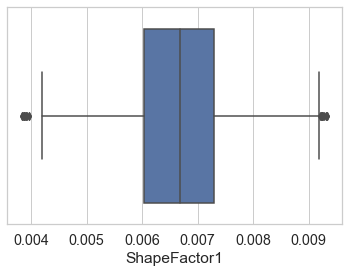

In [73]:
sns.boxplot(new_df['ShapeFactor1'])


In [74]:
q1 = df_bean['ShapeFactor2'].quantile(0.25)
q3 = df_bean['ShapeFactor2'].quantile(0.75)
iqr = q3-q1

In [75]:
q1,q3,iqr

(0.001158441, 0.0021727965, 0.0010143555)

In [76]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(-0.00036309224999999984, 0.00369432975)

In [77]:
# find the outliers
df_bean.loc[(df_bean['ShapeFactor2'] > upper_limit) | (df_bean['ShapeFactor2'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class


In [78]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['ShapeFactor2'] <= upper_limit) & (df_bean['ShapeFactor2'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 13543
outliers: 0


<AxesSubplot:xlabel='ShapeFactor2'>

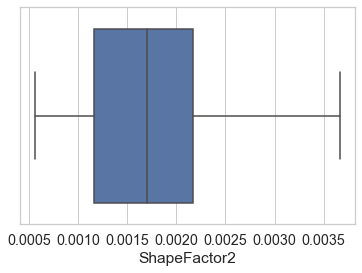

In [79]:
sns.boxplot(new_df['ShapeFactor2'])


In [80]:
q1 = df_bean['ShapeFactor3'].quantile(0.25)
q3 = df_bean['ShapeFactor3'].quantile(0.75)
iqr = q3-q1

In [81]:
q1,q3,iqr

(0.582517205, 0.6963405300000001, 0.11382332500000003)

In [82]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(0.4117822175, 0.8670755175000001)

In [83]:
# find the outliers
df_bean.loc[(df_bean['ShapeFactor3'] > upper_limit) | (df_bean['ShapeFactor3'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,2
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,2
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,2
11,31091,638.558,210.486255,188.326848,1.117665,0.446622,31458,198.963039,0.786377,0.988334,0.958173,0.945254,0.006770,0.003334,0.893506,0.998640,2
14,31158,641.105,212.066975,187.192960,1.132879,0.469924,31474,199.177302,0.781313,0.989960,0.952623,0.939219,0.006806,0.003267,0.882132,0.999349,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1871,47096,807.722,255.178500,235.341561,1.084290,0.386564,47740,244.876478,0.795272,0.986510,0.907131,0.959628,0.005418,0.002834,0.920886,0.998508,2
1995,52737,835.521,277.796690,241.958718,1.148116,0.491297,53211,259.127061,0.790067,0.991092,0.949315,0.932794,0.005268,0.002460,0.870104,0.998981,2
2179,57812,906.071,289.548558,254.931013,1.135792,0.474152,58725,271.308910,0.769390,0.984453,0.884919,0.937007,0.005008,0.002382,0.877981,0.997204,5
2239,59936,922.980,295.432860,259.732600,1.137450,0.476528,60869,276.247869,0.834159,0.984672,0.884124,0.935061,0.004929,0.002324,0.874340,0.994518,5


In [84]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['ShapeFactor3'] <= upper_limit) & (df_bean['ShapeFactor3'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 13341
outliers: 202


<AxesSubplot:xlabel='ShapeFactor3'>

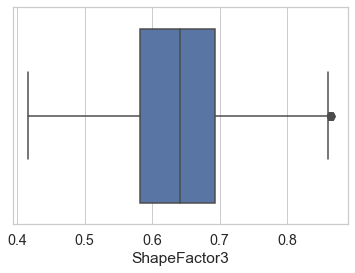

In [85]:
sns.boxplot(new_df['ShapeFactor3'])


In [86]:
q1 = df_bean['MajorAxisLength'].quantile(0.25)
q3 = df_bean['MajorAxisLength'].quantile(0.75)
iqr = q3-q1

In [87]:
q1,q3,iqr

(253.08680635000002, 376.31248875, 123.22568239999998)

In [88]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(68.24828275000004, 561.15101235)

In [89]:
# find the outliers
df_bean.loc[(df_bean['MajorAxisLength'] > upper_limit) | (df_bean['MajorAxisLength'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
3426,149264,1501.818,581.235920,329.483872,1.764080,0.823809,151608,435.945900,0.807706,0.984539,0.831630,0.750033,0.003894,0.000760,0.562549,0.992381,6
3427,149462,1505.818,564.968608,341.480766,1.654467,0.796663,152402,436.234947,0.798135,0.980709,0.828315,0.772140,0.003780,0.000829,0.596200,0.986394,6
3429,149941,1485.141,563.717847,342.711269,1.644877,0.793977,152636,436.933417,0.710823,0.982344,0.854269,0.775092,0.003760,0.000837,0.600768,0.988190,6
3431,150169,1496.077,562.823437,342.794875,1.641867,0.793122,151971,437.265490,0.779026,0.988142,0.843106,0.776914,0.003748,0.000842,0.603596,0.991023,6
3434,150664,1500.495,582.438202,332.045178,1.754093,0.821579,152581,437.985574,0.778819,0.987436,0.840911,0.751986,0.003866,0.000763,0.565483,0.991911,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3866,237270,1921.685,738.144502,412.921647,1.787614,0.828895,240671,549.637650,0.784115,0.985869,0.807399,0.744621,0.003111,0.000590,0.554460,0.991160,6
3867,241322,1895.940,726.373493,427.370120,1.699636,0.808598,244319,554.311026,0.820823,0.987733,0.843641,0.763121,0.003010,0.000630,0.582354,0.989790,6
3868,248424,1884.557,715.053040,446.043618,1.603101,0.781591,251082,562.408446,0.807536,0.989414,0.878992,0.786527,0.002878,0.000679,0.618625,0.991718,6
3869,251432,1919.868,719.125690,450.926187,1.594775,0.778981,257425,565.803115,0.766776,0.976719,0.857211,0.786793,0.002860,0.000676,0.619043,0.987235,6


In [90]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['MajorAxisLength'] <= upper_limit) & (df_bean['MajorAxisLength'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 13164
outliers: 379


<AxesSubplot:xlabel='MajorAxisLength'>

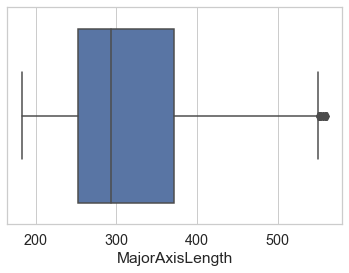

In [91]:
sns.boxplot(new_df['MajorAxisLength'])


In [92]:
q1 = df_bean['MinorAxisLength'].quantile(0.25)
q3 = df_bean['MinorAxisLength'].quantile(0.75)
iqr = q3-q1

In [93]:
q1,q3,iqr

(175.8863571, 217.24540345, 41.35904635)

In [94]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(113.847787575, 279.283972975)

In [95]:
# find the outliers
df_bean.loc[(df_bean['MinorAxisLength'] > upper_limit) | (df_bean['MinorAxisLength'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
3088,78414,1108.022,352.244776,285.347398,1.234442,0.586316,80312,315.974375,0.705936,0.976367,0.802614,0.897031,0.004492,0.001794,0.804664,0.993311,5
3142,79828,1120.981,352.089963,289.499747,1.216201,0.569152,81337,318.810549,0.730323,0.981448,0.798305,0.905480,0.004411,0.001829,0.819895,0.997157,5
3144,79877,1106.017,363.833007,280.253937,1.298226,0.637704,81101,318.908380,0.779440,0.984908,0.820556,0.876524,0.004555,0.001659,0.768294,0.997420,5
3171,80677,1122.027,362.299052,285.445525,1.269241,0.615838,82097,320.501399,0.733861,0.982703,0.805291,0.884632,0.004491,0.001696,0.782574,0.993275,5
3187,81338,1134.946,370.539639,280.276974,1.322048,0.654107,82905,321.811681,0.761849,0.981099,0.793511,0.868495,0.004556,0.001599,0.754283,0.997198,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5495,106700,1255.058,469.422674,291.873017,1.608311,0.783200,108228,368.584671,0.696466,0.985882,0.851230,0.785187,0.004399,0.001032,0.616519,0.991554,4
5497,107911,1298.822,498.597779,279.350337,1.784848,0.828309,110337,370.670410,0.731898,0.978013,0.803852,0.743426,0.004620,0.000871,0.552682,0.986453,4
5498,114858,1300.819,512.736642,287.561719,1.783049,0.827926,115826,382.415674,0.688713,0.991643,0.852977,0.745833,0.004464,0.000852,0.556266,0.991850,4
5499,115608,1298.623,500.298310,296.898826,1.685080,0.804876,117222,383.662192,0.779650,0.986231,0.861453,0.766867,0.004328,0.000923,0.588085,0.990970,4


In [96]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['MinorAxisLength'] <= upper_limit) & (df_bean['MinorAxisLength'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 12976
outliers: 567


<AxesSubplot:xlabel='MinorAxisLength'>

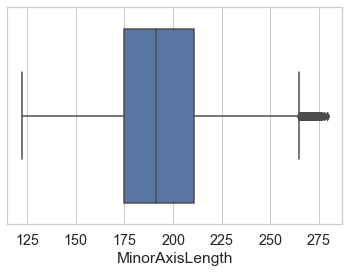

In [97]:
sns.boxplot(new_df['MinorAxisLength'])


In [98]:
q1 = df_bean['Compactness'].quantile(0.25)
q3 = df_bean['Compactness'].quantile(0.75)
iqr = q3-q1

In [99]:
q1,q3,iqr

(0.7632281475, 0.834470209, 0.07124206150000001)

In [100]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(0.65636505525, 0.94133330125)

In [101]:
# find the outliers
df_bean.loc[(df_bean['Compactness'] > upper_limit) | (df_bean['Compactness'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,2
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,2
11,31091,638.558,210.486255,188.326848,1.117665,0.446622,31458,198.963039,0.786377,0.988334,0.958173,0.945254,0.006770,0.003334,0.893506,0.998640,2
25,31682,646.721,210.045682,192.248416,1.092574,0.402842,32026,200.845152,0.773184,0.989259,0.951894,0.956197,0.006630,0.003419,0.914314,0.998956,2
30,31821,649.681,213.735645,189.969202,1.125107,0.458287,32168,201.285259,0.772354,0.989213,0.947378,0.941749,0.006717,0.003259,0.886891,0.997847,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7030,59651,1028.745,421.986456,180.963315,2.331890,0.903382,60407,275.590298,0.582268,0.987485,0.708292,0.653079,0.007074,0.000794,0.426512,0.994578,3
7104,60627,997.144,423.870736,183.178567,2.313976,0.901799,61352,277.835732,0.655824,0.988183,0.766232,0.655473,0.006991,0.000796,0.429645,0.994187,3
7316,64919,1031.617,439.350267,188.433009,2.331599,0.903357,65490,287.502066,0.654954,0.991281,0.766557,0.654380,0.006768,0.000765,0.428213,0.998422,3
7329,65376,1042.788,440.229537,190.351389,2.312720,0.901686,66068,288.512233,0.572379,0.989526,0.755503,0.655368,0.006734,0.000766,0.429507,0.993329,3


In [102]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['Compactness'] <= upper_limit) & (df_bean['Compactness'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 13419
outliers: 124


<AxesSubplot:xlabel='Compactness'>

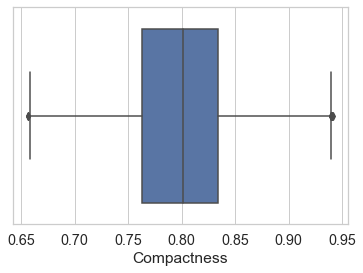

In [103]:
sns.boxplot(new_df['Compactness'])


In [104]:
q1 = df_bean['Eccentricity'].quantile(0.25)
q3 = df_bean['Eccentricity'].quantile(0.75)
iqr = q3-q1

In [105]:
q1,q3,iqr

(0.715143836, 0.809671415, 0.09452757899999997)

In [106]:
upper_limit = q3 + (1.5 * iqr)
lower_limit = q1 - (1.5 * iqr)
lower_limit, upper_limit

(0.5733524675, 0.9514627834999999)

In [107]:
# find the outliers
df_bean.loc[(df_bean['Eccentricity'] > upper_limit) | (df_bean['Eccentricity'] < lower_limit)]

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,2
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,2
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,2
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,2
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10156,23727,559.503,189.799385,159.371770,1.190922,0.543073,24021,173.810686,0.803760,0.987761,0.952462,0.915760,0.007999,0.003470,0.838616,0.998727,0
10342,25611,608.736,199.175134,165.282445,1.205059,0.558009,26203,180.579451,0.717395,0.977407,0.868517,0.906637,0.007777,0.003241,0.821990,0.990546,0
10422,26103,586.200,200.778166,165.664025,1.211960,0.564972,26413,182.305710,0.773766,0.988263,0.954572,0.907996,0.007692,0.003225,0.824456,0.999208,0
11454,30465,635.788,215.120868,181.064726,1.188088,0.539964,30796,196.949848,0.761701,0.989252,0.947079,0.915531,0.007061,0.003060,0.838197,0.995852,0


In [108]:
# trimming - delete the outlier data
new_df = df_bean.loc[(df_bean['Eccentricity'] <= upper_limit) & (df_bean['Eccentricity'] >= lower_limit)]
print('before removing outliers:', len(df_bean))
print('after removing outliers:',len(new_df))
print('outliers:', len(df_bean)-len(new_df))

before removing outliers: 13543
after removing outliers: 12710
outliers: 833


<AxesSubplot:xlabel='Eccentricity'>

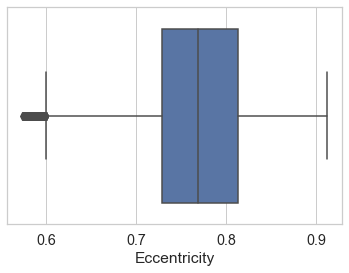

In [109]:
sns.boxplot(new_df['Eccentricity'])


# 5.Data Spliting


In [110]:
x= df_bean.iloc[:,:-1].values  
y= df_bean.iloc[:, -1].values 

# 6.Train Test Split


In [111]:
from sklearn.model_selection import train_test_split  
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.25, random_state=0)

# 7.Data Standardization

In [112]:
from sklearn.preprocessing import StandardScaler    
st_x= StandardScaler()    
x_train= st_x.fit_transform(x_train)    
x_test= st_x.transform(x_test)

# 8.Importing EvaluAtion Libraries


In [113]:
from sklearn import metrics
from sklearn.metrics import precision_score,accuracy_score,recall_score,confusion_matrix
from sklearn.metrics import classification_report

# 9. Implementing Algorithm

##  Instantiate K nearest neighbour Classifier

### Training The Model


In [114]:
from sklearn.neighbors import KNeighborsClassifier  
classifier= KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2 )  
classifier.fit(x_train, y_train)

KNeighborsClassifier()

### Predicting

In [115]:

y_pred=classifier.predict(x_test)

In [116]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.91      0.92      0.91       915
           1       0.85      0.86      0.86       663
           2       0.94      0.95      0.94       474
           3       0.95      0.94      0.95       464
           4       0.93      0.96      0.94       431
           5       0.96      0.88      0.92       322
           6       1.00      1.00      1.00       117

    accuracy                           0.92      3386
   macro avg       0.94      0.93      0.93      3386
weighted avg       0.92      0.92      0.92      3386



### Model evaluation using Accuracy Score,Recall, f1Score, Precision and Confusion Matrix

In [117]:
Evaluation=pd.DataFrame(['knn'],columns=['Algorithm'])

Evaluation.loc[0,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[0,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[0,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[0,'Accuracy']=metrics.accuracy_score(y_test,y_pred)

In [118]:
Evaluation


,Algorithm,Precision,Recall,F1 Score,Accuracy
0,knn,0.919374,0.919374,0.919374,0.919374


In [119]:
classifier.score(x_test,y_test)


0.9193738924985233

In [120]:
cm=confusion_matrix(y_test,y_pred)
print(cm)

[[840  55  19   1   0   0   0]
 [ 71 571   7  10   1   3   0]
 [  7  15 450   0   0   2   0]
 [  4  13   0 438   8   1   0]
 [  0   5   1   7 413   5   0]
 [  0  10   3   3  22 284   0]
 [  0   0   0   0   0   0 117]]


## Decision Tree


### Training The Model


In [121]:
from sklearn.tree import DecisionTreeClassifier
dtc_model = DecisionTreeClassifier()
dtc_model.fit(x_train,y_train)

DecisionTreeClassifier()

### Predicting 

In [122]:
y_pred = dtc_model.predict(x_test)


In [123]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.90      0.88      0.89       915
           1       0.81      0.82      0.81       663
           2       0.90      0.93      0.91       474
           3       0.92      0.91      0.91       464
           4       0.93      0.90      0.92       431
           5       0.87      0.89      0.88       322
           6       1.00      0.99      1.00       117

    accuracy                           0.89      3386
   macro avg       0.90      0.90      0.90      3386
weighted avg       0.89      0.89      0.89      3386



### Model evaluation using Accuracy Score,Recall, f1Score, Precision and Confusion Matrix

In [124]:
Evaluation.loc[1,'Algorithm']='Decision Tree'
Evaluation.loc[1,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[1,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[1,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[1,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,knn,0.919374,0.919374,0.919374,0.919374
1,Decision Tree,0.887183,0.887183,0.887183,0.887183


In [125]:
dtc_model.score(x_test,y_test)

0.887182516243355

In [126]:
cm=confusion_matrix(y_test,y_pred)
print(cm)

[[806  79  22   8   0   0   0]
 [ 79 543  13  14   4  10   0]
 [  8  21 442   0   2   1   0]
 [  6  14   0 421  12  11   0]
 [  0   5   5  13 388  20   0]
 [  0  10  11   2  11 288   0]
 [  0   0   0   0   0   1 116]]


## Naive Bayes


### Training The Model


In [127]:
from sklearn.naive_bayes import GaussianNB
cla = GaussianNB()
cla.fit(x_train, y_train)
#cla.score(x_test,y_test)

GaussianNB()

In [128]:
cla.score(x_test,y_test)

0.8907265209686946

### Predicting 

In [129]:
y_pred=cla.predict(x_test)

### Model evaluation using Accuracy Score,Recall, f1Score, Precision and Confusion Matrix

In [130]:
Evaluation.loc[2,'Algorithm']='Naive Bayes'
Evaluation.loc[2,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[2,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[2,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[2,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,knn,0.919374,0.919374,0.919374,0.919374
1,Decision Tree,0.887183,0.887183,0.887183,0.887183
2,Naive Bayes,0.890727,0.890727,0.890727,0.890727


In [131]:
cla.score(x_test,y_test)

0.8907265209686946

In [132]:
cm=confusion_matrix(y_test,y_pred)
print(cm)

[[802  81  30   2   0   0   0]
 [ 61 567  11  19   1   4   0]
 [  3  23 445   0   0   3   0]
 [  4   9   0 440   9   2   0]
 [  0   1   0   5 386  37   2]
 [  0  16   3   2  42 259   0]
 [  0   0   0   0   0   0 117]]


## Random Forest

### Training The Model


In [133]:
from sklearn.ensemble import RandomForestClassifier
classifier1 = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
classifier1.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)

### Predicting

In [134]:
y_pred=classifier1.predict(x_test)

### Model evaluation using Accuracy Score,Recall, f1Score, Precision and Confusion Matrix

In [136]:
Evaluation.loc[3,'Algorithm']='RF'
Evaluation.loc[3,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[3,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[3,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[3,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,knn,0.919374,0.919374,0.919374,0.919374
1,Decision Tree,0.887183,0.887183,0.887183,0.887183
2,Naive Bayes,0.890727,0.890727,0.890727,0.890727
3,RF,0.918193,0.918193,0.918193,0.918193


In [137]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.91      0.92      0.92       915
           1       0.86      0.85      0.86       663
           2       0.93      0.96      0.94       474
           3       0.95      0.93      0.94       464
           4       0.94      0.96      0.95       431
           5       0.95      0.89      0.92       322
           6       1.00      0.99      1.00       117

    accuracy                           0.92      3386
   macro avg       0.93      0.93      0.93      3386
weighted avg       0.92      0.92      0.92      3386



In [138]:
classifier1.score(x_test,y_test)

0.9181925575900768

In [139]:
cm=confusion_matrix(y_test,y_pred)
print(cm)

[[846  47  20   2   0   0   0]
 [ 75 566  10  11   0   1   0]
 [  3  17 453   0   0   1   0]
 [  5  13   0 431   9   6   0]
 [  0   4   1   9 412   5   0]
 [  0  12   4   2  19 285   0]
 [  0   0   0   0   0   1 116]]


## Logistic Regression

###  Training The Model


In [140]:
from sklearn.linear_model import LogisticRegression
regressor=LogisticRegression(random_state=0)
regressor.fit(x_train,y_train)

LogisticRegression(random_state=0)

### Predicting

In [141]:
y_pred=regressor.predict(x_test)

In [142]:
regressor.score(x_test,y_test)

0.9208505611340815

In [143]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.92      0.92      0.92       915
           1       0.85      0.87      0.86       663
           2       0.93      0.95      0.94       474
           3       0.96      0.94      0.95       464
           4       0.94      0.95      0.94       431
           5       0.94      0.89      0.91       322
           6       1.00      1.00      1.00       117

    accuracy                           0.92      3386
   macro avg       0.93      0.93      0.93      3386
weighted avg       0.92      0.92      0.92      3386



### Model evaluation using Accuracy Score,Recall, f1Score, Precision and Confusion Matrix

In [144]:
Evaluation.loc[4,'Algorithm']='LR'
Evaluation.loc[4,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[4,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[4,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[4,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,knn,0.919374,0.919374,0.919374,0.919374
1,Decision Tree,0.887183,0.887183,0.887183,0.887183
2,Naive Bayes,0.890727,0.890727,0.890727,0.890727
3,RF,0.918193,0.918193,0.918193,0.918193
4,LR,0.920851,0.920851,0.920851,0.920851


In [145]:
cm=confusion_matrix(y_test,y_pred)
print(cm)

[[846  53  15   1   0   0   0]
 [ 62 575  13  12   0   1   0]
 [  2  18 450   0   0   4   0]
 [  5  12   0 436   8   3   0]
 [  0   5   1   6 408  11   0]
 [  0  11   4   1  20 286   0]
 [  0   0   0   0   0   0 117]]


## Support Vector Machine

### Training The Model
 

In [146]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'linear', random_state = 0)
classifier.fit(x_train, y_train)

SVC(kernel='linear', random_state=0)

### Predicting

In [147]:
y_pred=classifier.predict(x_test)

In [148]:
report=classification_report(y_test,y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.92      0.93      0.93       915
           1       0.87      0.86      0.87       663
           2       0.93      0.95      0.94       474
           3       0.95      0.94      0.94       464
           4       0.93      0.95      0.94       431
           5       0.93      0.90      0.92       322
           6       1.00      0.99      1.00       117

    accuracy                           0.92      3386
   macro avg       0.93      0.93      0.93      3386
weighted avg       0.92      0.92      0.92      3386



### Model evaluation using Accuracy Score,Recall, f1Score, Precision and Confusion Matrix

In [149]:
Evaluation.loc[5,'Algorithm']='SVM_linear'
Evaluation.loc[5,'Precision']=metrics.precision_score(y_test, y_pred, average='micro')
Evaluation.loc[5,'Recall']=metrics.recall_score(y_test, y_pred, average='micro')
Evaluation.loc[5,'F1 Score']=metrics.f1_score(y_test, y_pred, average='micro')
Evaluation.loc[5,'Accuracy']=metrics.accuracy_score(y_test,y_pred)
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,knn,0.919374,0.919374,0.919374,0.919374
1,Decision Tree,0.887183,0.887183,0.887183,0.887183
2,Naive Bayes,0.890727,0.890727,0.890727,0.890727
3,RF,0.918193,0.918193,0.918193,0.918193
4,LR,0.920851,0.920851,0.920851,0.920851
5,SVM_linear,0.922327,0.922327,0.922327,0.922327


In [150]:
classifier.score(x_test,y_test)

0.9223272297696397

In [151]:
cm=confusion_matrix(y_test,y_pred)
print(cm)

[[855  43  16   1   0   0   0]
 [ 66 569  12  14   0   2   0]
 [  2  19 450   0   0   3   0]
 [  5  11   0 435   9   4   0]
 [  0   4   1   6 408  12   0]
 [  0   6   5   1  20 290   0]
 [  0   0   0   0   1   0 116]]


# 10.Comparing model

<AxesSubplot:xlabel='Algorithm', ylabel='Precision'>

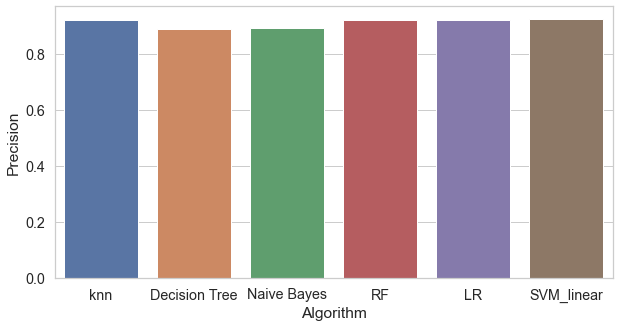

In [152]:
plt.figure(figsize=(10,5))
sns.barplot(x='Algorithm',y='Precision',data=Evaluation)

<AxesSubplot:xlabel='Algorithm', ylabel='Accuracy'>

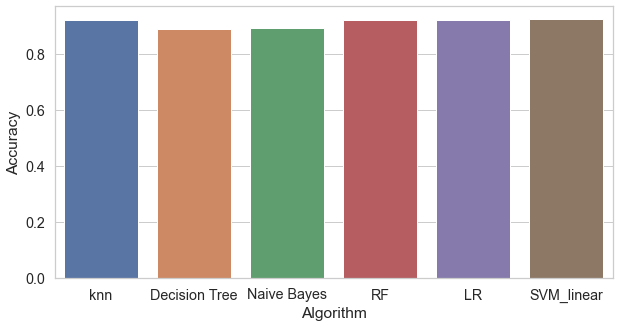

In [153]:
plt.figure(figsize=(10,5))
sns.barplot(x='Algorithm',y='Accuracy',data=Evaluation)

<AxesSubplot:xlabel='Algorithm', ylabel='Recall'>

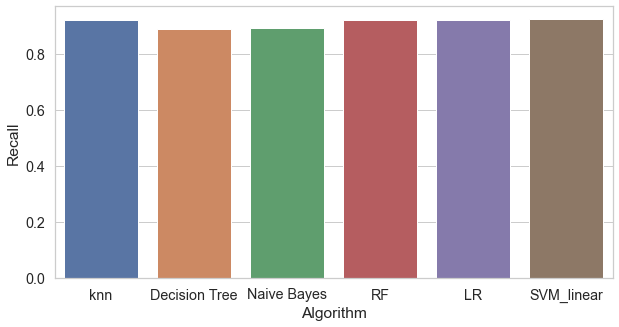

In [154]:
plt.figure(figsize=(10,5))
sns.barplot(x='Algorithm',y='Recall',data=Evaluation)

<AxesSubplot:xlabel='Algorithm', ylabel='F1 Score'>

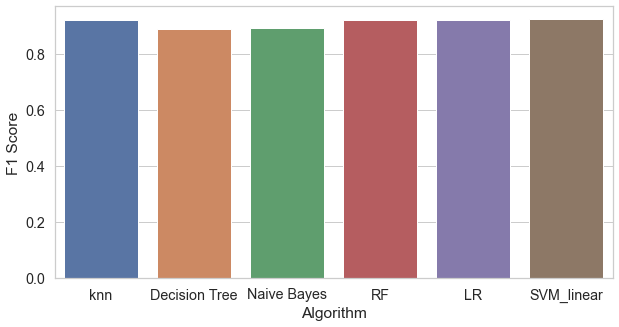

In [155]:
plt.figure(figsize=(10,5))
sns.barplot(x='Algorithm',y='F1 Score',data=Evaluation)

In [156]:
Evaluation[Evaluation.Recall==Evaluation.Recall.min()]

,Algorithm,Precision,Recall,F1 Score,Accuracy
1,Decision Tree,0.887183,0.887183,0.887183,0.887183


In [157]:
Evaluation[Evaluation.Recall==Evaluation.Recall.max()]

,Algorithm,Precision,Recall,F1 Score,Accuracy
5,SVM_linear,0.922327,0.922327,0.922327,0.922327


In [158]:
Evaluation[Evaluation.Precision==Evaluation.Precision.min()]

,Algorithm,Precision,Recall,F1 Score,Accuracy
1,Decision Tree,0.887183,0.887183,0.887183,0.887183


In [159]:
Evaluation[Evaluation.Precision==Evaluation.Precision.max()]

,Algorithm,Precision,Recall,F1 Score,Accuracy
5,SVM_linear,0.922327,0.922327,0.922327,0.922327


In [160]:
Evaluation[Evaluation.Accuracy==Evaluation.Accuracy.min()]

,Algorithm,Precision,Recall,F1 Score,Accuracy
1,Decision Tree,0.887183,0.887183,0.887183,0.887183


In [161]:
Evaluation[Evaluation.Accuracy==Evaluation.Accuracy.max()]

,Algorithm,Precision,Recall,F1 Score,Accuracy
5,SVM_linear,0.922327,0.922327,0.922327,0.922327


In [162]:
Evaluation

,Algorithm,Precision,Recall,F1 Score,Accuracy
0,knn,0.919374,0.919374,0.919374,0.919374
1,Decision Tree,0.887183,0.887183,0.887183,0.887183
2,Naive Bayes,0.890727,0.890727,0.890727,0.890727
3,RF,0.918193,0.918193,0.918193,0.918193
4,LR,0.920851,0.920851,0.920851,0.920851
5,SVM_linear,0.922327,0.922327,0.922327,0.922327


# 11.Conclusion
- Logistic regression,SVM and KNN gives same efficency which is 92%
- Decision tree gives  efficency which is 89%
- All the algorithm gives almost similar Efficency.
- Best can be Logistic Or SVM_linear